In [134]:
import pandas as pd

In [135]:
clientes = pd.read_excel('/content/db_clientes.xlsx')
estados = pd.read_csv('/content/db_estados_brasileiros.csv', sep=';', encoding='latin-1')
idade = pd.read_csv('/content/db_idade_clientes.csv', sep=';', encoding='latin-1')

In [136]:
!pip install dataprep
from dataprep.eda import create_report

DataPrep Report
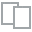
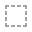
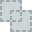
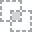
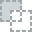
...
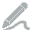
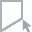
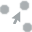
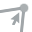
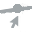

In [137]:
create_report(base_completa)

In [138]:
estados.isna().sum()

id_estado       0
estado          0
sigla_estado    0
pais            2
dtype: int64

In [139]:
idade.isna().sum()

id_cliente    0
idade         0
dtype: int64

In [140]:
clientes.isna().sum()

id_cliente    0
peso          0
colesterol    0
genero        0
id_estado     0
dtype: int64

In [141]:
estados.pais.fillna('Brasil',inplace=True)

In [142]:
estados

,id_estado,estado,sigla_estado,pais
0,1,Acre,ac,Brasil
1,2,Alagoas,al,Brasil
2,3,Amapá,ap,Brasil
3,4,Amazonas,am,Brasil
4,5,Bahia,ba,Brasil
5,6,Ceará,ce,Brasil
6,7,Distrito Federal,df,Brasil
7,8,Espírito Santo,es,Brasil
8,9,Goiás,go,Brasil
9,10,Maranhão,ma,Brasil


In [143]:
clientes

,id_cliente,peso,colesterol,genero,id_estado
0,1,102,111,Masculino,23
1,2,115,135,Masculino,7
2,3,115,136,Masculino,4
3,4,140,167,Feminino,24
4,5,130,158,Masculino,26
...,...,...,...,...,...
542,543,172,207,Masculino,22
543,544,129,157,Masculino,1
544,545,107,115,Masculino,6
545,546,117,147,Masculino,20


In [144]:
from sklearn.preprocessing import LabelEncoder
LE = LabelEncoder()
clientes['genero_number']=LE.fit_transform(clientes['genero'])

In [145]:
clientes

,id_cliente,peso,colesterol,genero,id_estado,genero_number
0,1,102,111,Masculino,23,1
1,2,115,135,Masculino,7,1
2,3,115,136,Masculino,4,1
3,4,140,167,Feminino,24,0
4,5,130,158,Masculino,26,1
...,...,...,...,...,...,...
542,543,172,207,Masculino,22,1
543,544,129,157,Masculino,1,1
544,545,107,115,Masculino,6,1
545,546,117,147,Masculino,20,1


In [146]:
clientes_estados = pd.merge(clientes, estados, on="id_estado")
clientes_estados

,id_cliente,peso,colesterol,genero,id_estado,genero_number,estado,sigla_estado,pais
0,1,102,111,Masculino,23,1,Roraima,rr,Brasil
1,54,149,183,Masculino,23,1,Roraima,rr,Brasil
2,61,113,129,Feminino,23,0,Roraima,rr,Brasil
3,147,141,171,Masculino,23,1,Roraima,rr,Brasil
4,154,134,162,Feminino,23,0,Roraima,rr,Brasil
...,...,...,...,...,...,...,...,...,...
542,452,117,138,Feminino,19,0,Rio de Janeiro,rj,Brasil
543,454,106,115,Masculino,19,1,Rio de Janeiro,rj,Brasil
544,510,110,120,Feminino,19,0,Rio de Janeiro,rj,Brasil
545,516,166,200,Feminino,19,0,Rio de Janeiro,rj,Brasil


In [147]:
base_completa = pd.merge(clientes_estados, idade, on="id_cliente").sort_values('id_cliente')

In [149]:
base_completa.duplicated().sum()

0

In [154]:
base_completa=base_completa.reset_index(drop=True)

In [155]:
base_completa.rename(columns={'id_cliente':'cod_cliente','genero_number':'cod_genero'}, inplace=True)

In [156]:
base_completa['sigla_estado']=base_completa.sigla_estado.str.upper()

In [157]:
base_completa

,cod_cliente,peso,colesterol,genero,id_estado,cod_genero,estado,sigla_estado,pais,idade
0,1,102,111,Masculino,23,1,Roraima,RR,Brasil,17
1,2,115,135,Masculino,7,1,Distrito Federal,DF,Brasil,28
2,3,115,136,Masculino,4,1,Amazonas,AM,Brasil,62
3,4,140,167,Feminino,24,0,Santa Catarina,SC,Brasil,55
4,5,130,158,Masculino,26,1,Sergipe,SE,Brasil,44
...,...,...,...,...,...,...,...,...,...,...
542,543,172,207,Masculino,22,1,Rondônia,RO,Brasil,20
543,544,129,157,Masculino,1,1,Acre,AC,Brasil,66
544,545,107,115,Masculino,6,1,Ceará,CE,Brasil,36
545,546,117,147,Masculino,20,1,Rio Grande do Norte,RN,Brasil,57


In [158]:
from sklearn.cluster import KMeans

In [159]:
def calcular_wcss(dados_cliente):
  wcss=[]
  for k in range(1,11):
    kmeans=KMeans(n_clusters=k)
    kmeans.fit(X=dados_cliente)
    wcss.append(kmeans.inertia_)
  return wcss

In [175]:
dados_cliente = base_completa[['peso','colesterol','idade']]

In [176]:
wcss_cliente=calcular_wcss(dados_cliente)

In [177]:
for i in range(len(wcss_cliente)):
  print(f'O cluster {i} possui valor WCSS de: {wcss_cliente[i]}')

O cluster 0 possui valor WCSS de: 1481446.4533820841
O cluster 1 possui valor WCSS de: 455970.5535834613
O cluster 2 possui valor WCSS de: 265021.2549377008
O cluster 3 possui valor WCSS de: 206738.26593357133
O cluster 4 possui valor WCSS de: 178433.04442735814
O cluster 5 possui valor WCSS de: 151039.13503247092
O cluster 6 possui valor WCSS de: 129576.49976750824
O cluster 7 possui valor WCSS de: 108337.29215751175
O cluster 8 possui valor WCSS de: 93442.30249957771
O cluster 9 possui valor WCSS de: 82799.70419933891


In [178]:
import plotly.express as px
import plotly.offline as py
import plotly.graph_objects as go

In [179]:
grafico_wcss = px.line (x=range(1,11),
                        y=wcss_cliente
                        )
fig = go.Figure(grafico_wcss)
fig.update_layout(title='calculando o WCSS',
                  xaxis_title='Número de clusters',
                  yaxis_title='Valor do WCSS',
                  template='plotly_white'
)

fig.show()

In [184]:
kmeans_cliente=KMeans(n_clusters=3,random_state=0)
base_completa['cluster']=kmeans_cliente.fit_predict(dados_cliente)

In [185]:
base_completa

,cod_cliente,peso,colesterol,genero,id_estado,cod_genero,estado,sigla_estado,pais,idade,cluster
0,1,102,111,Masculino,23,1,Roraima,RR,Brasil,17,0
1,2,115,135,Masculino,7,1,Distrito Federal,DF,Brasil,28,0
2,3,115,136,Masculino,4,1,Amazonas,AM,Brasil,62,0
3,4,140,167,Feminino,24,0,Santa Catarina,SC,Brasil,55,2
4,5,130,158,Masculino,26,1,Sergipe,SE,Brasil,44,2
...,...,...,...,...,...,...,...,...,...,...,...
542,543,172,207,Masculino,22,1,Rondônia,RO,Brasil,20,1
543,544,129,157,Masculino,1,1,Acre,AC,Brasil,66,2
544,545,107,115,Masculino,6,1,Ceará,CE,Brasil,36,0
545,546,117,147,Masculino,20,1,Rio Grande do Norte,RN,Brasil,57,0


In [186]:
centroides_clusters=kmeans_cliente.cluster_centers_
centroides_clusters

array([[110.31216931, 125.71957672,  43.54497354],
       [182.26315789, 217.04093567,  42.78362573],
       [141.80748663, 173.00534759,  42.03743316]])

In [187]:
grafico = px.scatter (x=base_completa['peso'],
                        y=base_completa['colesterol'],
                        color=base_completa['cluster'])

grafico_centroide = px.scatter(x=centroides_clusters[:,0],y=centroides_clusters[:,1],size=[7,7,7])
grafico_final = go.Figure(data=grafico.data+grafico_centroide.data)
grafico_final.update_layout(title='Clusterização',
                  xaxis_title='Peso',
                  yaxis_title='Colesterol')


grafico_final.show()

In [189]:
base_completa.loc[base_completa['cluster']==2,'nome_cluster']="Alto Risco"
base_completa.loc[base_completa['cluster']==1,'nome_cluster']="Médio Risco"
base_completa.loc[base_completa['cluster']==0,'nome_cluster']="Baixo Risco"

In [190]:
base_completa = base_completa.reset_index(drop=True)

In [191]:
base_completa.groupby(['nome_cluster']).describe()

cod_cliente                               ... cluster               
                   count        mean         std  min  ...     25%  50%  75%  max
nome_cluster                                           ...                       
Alto Risco         187.0  275.989305  158.324799  4.0  ...     2.0  2.0  2.0  2.0
Baixo Risco        189.0  270.873016  158.020248  1.0  ...     0.0  0.0  0.0  0.0
Médio Risco        171.0  275.280702  158.655760  6.0  ...     1.0  1.0  1.0  1.0

[3 rows x 56 columns]